In [1]:
import numpy as np
from scipy.linalg import null_space, orth, svd, qr, subspace_angles, det
import matplotlib.pyplot as plt
import torch
from transformers import GPT2Tokenizer, GPT2Model, GPT2LMHeadModel

tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2Model.from_pretrained("gpt2", output_hidden_states=True, output_attentions=True)
model.eval()

embeddings = model.wte.weight.data

print("Model name:", model.config.name_or_path)
print("Tokenizer:", tokenizer.name_or_path)
print("Vocabulary size:", tokenizer.vocab_size)
print("Embedding dimensions:", model.config.hidden_size)
print("Number of attention layers:", model.config.num_hidden_layers)

state_dict = model.state_dict()

WQ = torch.empty(12, 12, 768, 64)
WK = torch.empty_like(WQ)

bQ = torch.empty(12, 12, 64)
bK = torch.empty_like(bQ)

for layer in range(12):
    # [768, 2304] → chunk into [768, 768] each
    _WQ, _WK, _ = state_dict[f'h.{layer}.attn.c_attn.weight'].chunk(3, dim=1)
    _bQ, _bK, _ = state_dict[f'h.{layer}.attn.c_attn.bias'].chunk(3, dim=0)

    _h_WQ = _WQ.chunk(12, dim=1)
    _h_WK = _WK.chunk(12, dim=1)
    _h_bQ = _bQ.chunk(12, dim=0)
    _h_bK = _bK.chunk(12, dim=0)

    for head in range(12):
        WQ[layer, head] = _h_WQ[head]
        WK[layer, head] = _h_WK[head]
        bQ[layer, head] = _h_bQ[head]
        bK[layer, head] = _h_bK[head]

Model name: gpt2
Tokenizer: gpt2
Vocabulary size: 50257
Embedding dimensions: 768
Number of attention layers: 12


In [2]:
layer = 0

WQ_layer = WQ[layer]
bQ_layer = bQ[layer]
WK_layer = WK[layer]
bK_layer = bK[layer]

J = torch.empty(12, 769, 769)
U, V = torch.empty(12, 769, 64), torch.empty(12, 769, 64)
S = torch.empty(12, 64)

for head in range(12):
    J[head, :768, :768] = WQ_layer[head] @ WK_layer[head].t()
    J[head, 768, :768] = bQ_layer[head] @ WK_layer[head].t()
    J[head, :768, 768] = WQ_layer[head] @ bK_layer[head]
    J[head, 768, 768] = bQ_layer[head].t() @ bK_layer[head]
    #J[head] = J[head] / torch.linalg.norm(J[head])

    _U, _S, _Vt = svd(J[head])
    U[head] = torch.tensor(_U[:, :64])
    S[head] = torch.tensor(_S[:64])
    V[head] = torch.tensor(_Vt[:64, :].T)

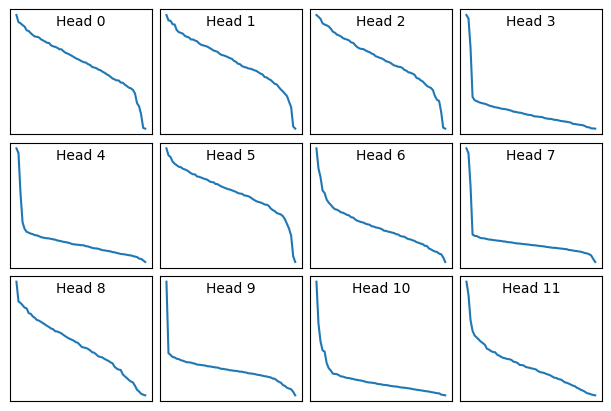

In [3]:
fig, axs = plt.subplots(3, 4, figsize=(6, 4), constrained_layout=True)
#plt.suptitle(f'Layer {layer} Singular Values of Attention Heads', fontsize=16, y=1.06)
for i in range(12):
    axs[i//4, i%4].plot(S[i])
    #axs[i//3, i%3].set_ylim(0, 0.3)
    axs[i//4, i%4].text(0.5, 0.9, f'Head {i}', transform=axs[i//4, i%4].transAxes, ha='center', va='center')
    axs[i//4, i%4].set_xticks([])
    axs[i//4, i%4].set_yticks([])
#plt.savefig(f'layer_{layer}_singular_values.pdf', dpi=300)
plt.show()

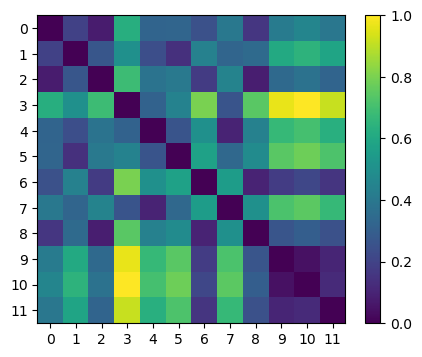

In [4]:
sigma_distance = np.zeros([12, 12], dtype=np.float32)
for i in range(12):
    for j in range(12):
        sigma_distance[i, j] = torch.linalg.norm(S[i] - S[j])

sigma_distance = sigma_distance / np.max(sigma_distance)

fig, ax = plt.subplots(figsize=(5, 4))
ax.imshow(sigma_distance, cmap='viridis', interpolation='nearest')
#ax.set_title(f'Singular values distance $||\\Sigma_i-\\Sigma_j||$ for layer {layer}', fontsize=14)
plt.colorbar(ax.imshow(sigma_distance, cmap='viridis', interpolation='nearest'))
plt.xticks(ticks=np.arange(12))
plt.yticks(ticks=np.arange(12))
#plt.savefig(f'layer_{layer}_sigma_distance.pdf', dpi=300)
plt.show()

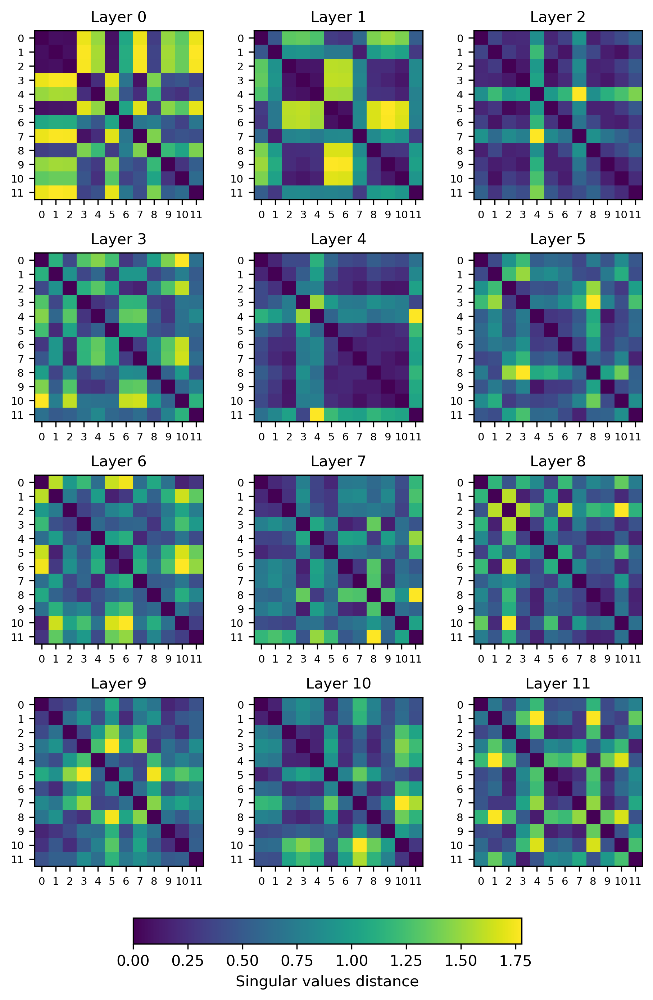

In [5]:
fig, axs = plt.subplots(4, 3, figsize=(6, 8), dpi=300)
cmap = plt.get_cmap('viridis')

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    distance = np.zeros([12, 12], dtype=np.float32)
    S = torch.empty(12, 64)
    for head in range(12):
        J = torch.empty(769, 769)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]
        _, _S, _ = svd(J)
        S[head] = torch.tensor(_S[:64])
        S[head] = S[head] / torch.max(S[head])


    for i in range(12):
        for j in range(12):
            if i > j:
                sigma_distance = torch.linalg.norm(S[i] - S[j])
                distance[i, j] = sigma_distance
                distance[j, i] = distance[i, j]

    ax = axs[layer//3, layer%3]
    im = ax.imshow(distance, cmap='viridis', interpolation='nearest')
    ax.set_title(f"Layer {layer}", fontsize=10)
    ax.set_xticks(np.arange(12))
    ax.set_yticks(np.arange(12))
    ax.tick_params(axis='both', which='major', labelsize=7)

plt.tight_layout(pad=0, w_pad=0.8, h_pad=0.8)
cbar_ax = fig.add_axes([0.2, -0.08, 0.6, 0.03])
fig.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Singular values distance', shrink=0.8)
plt.subplots_adjust(bottom=0.01)
plt.savefig('sigma.pdf', dpi=300, bbox_inches='tight')
plt.show()

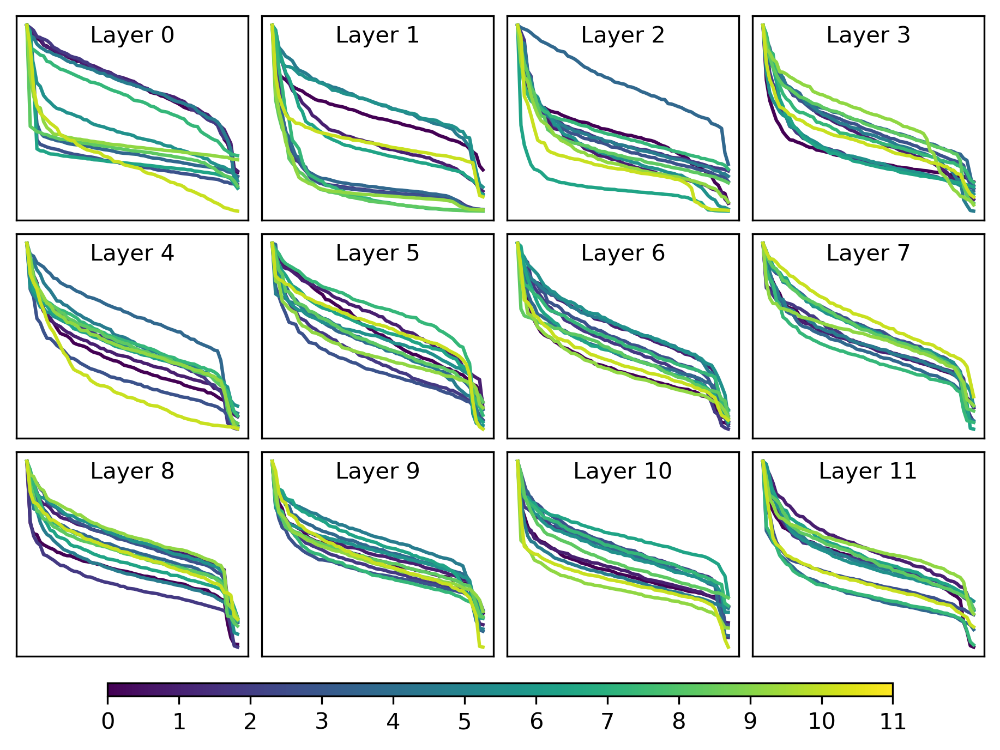

In [6]:
fig, axs = plt.subplots(3, 4, figsize=(6, 4), constrained_layout=True, dpi=300)
cmap = plt.get_cmap('viridis')  # You can choose other colormaps like 'jet', 'plasma', etc.

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    for head in range(12):
        J = torch.empty(769, 769)
        S = torch.empty(64)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]

        _, _S, _ = svd(J)
        S = torch.tensor(_S[:64])
        S = S / S[0]
        
        color = cmap(head/12)  # Normalize head index to [0, 1] for colormap
        axs[layer//4, layer%4].plot(S, color=color)
        
    axs[layer//4, layer%4].text(0.5, 0.9, f'Layer {layer}', transform=axs[layer//4, layer%4].transAxes, ha='center', va='center')
    axs[layer//4, layer%4].set_xticks([])
    axs[layer//4, layer%4].set_yticks([])

# Add a discrete colorbar at the bottom
import matplotlib.colors as mcolors
import matplotlib.cm as cm

# Create a ScalarMappable object for the colormap
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=11))
sm.set_array([])  # You have to set the array for mappable

# Add the colorbar to the figure
cbar_ax = fig.add_axes([0.1, -0.05, 0.8, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(sm, cax=cbar_ax, ticks=np.arange(0, 12, 1), orientation='horizontal')
cbar.ax.set_xticklabels([f'{i}' for i in range(12)])  # Label each tick with the head number
plt.savefig(f'layers_singular_values.pdf', dpi=300)
plt.show()


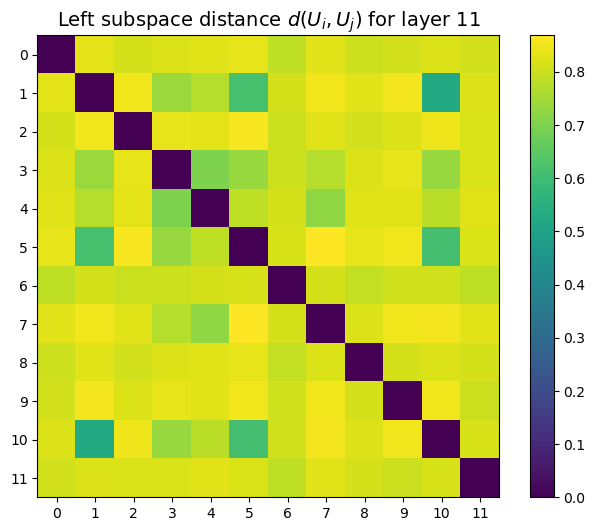

In [7]:
grassmann_U_distance = np.zeros([12, 12], dtype=np.float32)
for i in range(12):
    for j in range(12):
        if i > j:
            #grassmann_U_distance[i, j] = np.sum(1-np.cos(subspace_angles(U[i], U[j]))**2) / 64
            grassmann_U_distance[i, j] = np.sqrt(np.sum(subspace_angles(U[i], U[j])**2)) / (4*np.pi)
            grassmann_U_distance[j, i] = grassmann_U_distance[i, j]

fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(grassmann_U_distance, cmap='viridis', interpolation='nearest')
ax.set_title(f'Left subspace distance $d(U_i, U_j)$ for layer {layer}', fontsize=14)
plt.colorbar(ax.imshow(grassmann_U_distance, cmap='viridis', interpolation='nearest'))
plt.xticks(ticks=np.arange(12))
plt.yticks(ticks=np.arange(12))
plt.show()

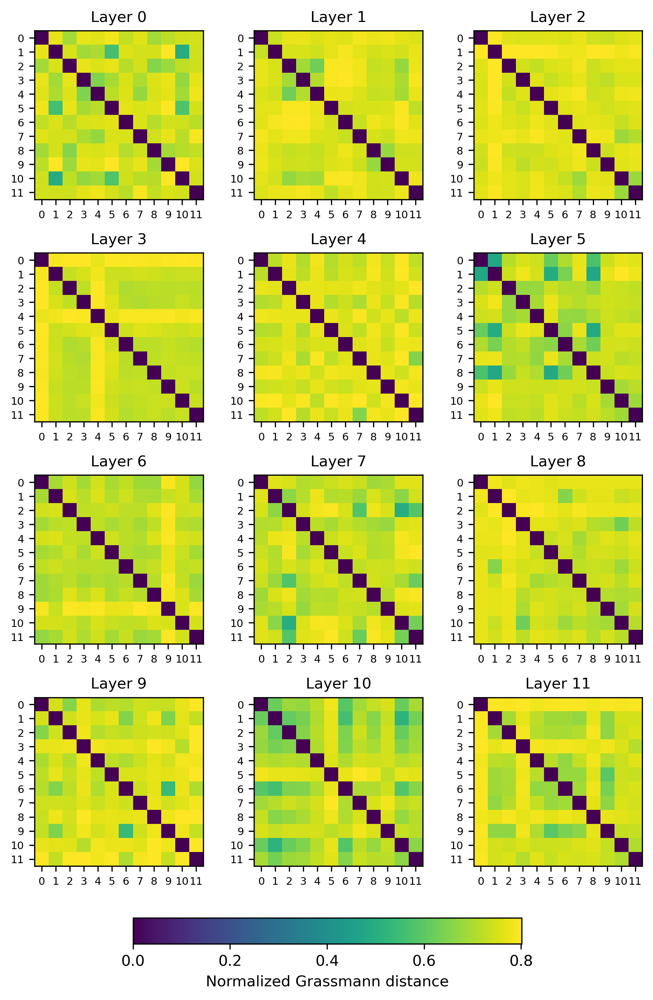

In [8]:
fig, axs = plt.subplots(4, 3, figsize=(6, 8), dpi=300)
cmap = plt.get_cmap('viridis')

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    grassmann_V_distance = np.zeros([12, 12], dtype=np.float32)
    U, V = torch.empty(12, 769, 64), torch.empty(12, 769, 64)
    for head in range(12):
        J = torch.empty(769, 769)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]
        _U, _, _Vt = svd(J)
        U[head] = torch.tensor(_U[:, :64])
        V[head] = torch.tensor(_Vt[:64, :].T)

    for i in range(12):
        for j in range(12):
            if i > j:
                grassmann_V_distance[i, j] = np.sqrt(np.sum(subspace_angles(V[i], V[j])**2)) / (4*np.pi)
                grassmann_V_distance[j, i] = grassmann_V_distance[i, j]

    ax = axs[layer//3, layer%3]
    im = ax.imshow(grassmann_V_distance, cmap='viridis', interpolation='nearest')
    ax.set_title(f"Layer {layer}", fontsize=10)
    ax.set_xticks(np.arange(12))
    ax.set_yticks(np.arange(12))
    ax.tick_params(axis='both', which='major', labelsize=7)

plt.tight_layout(pad=0, w_pad=0.8, h_pad=0.8)
cbar_ax = fig.add_axes([0.2, -0.08, 0.6, 0.03])
fig.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Normalized Grassmann distance', shrink=0.8)
plt.subplots_adjust(bottom=0.01)
plt.savefig('grassmann_V_distance.pdf', dpi=300, bbox_inches='tight')
plt.show()

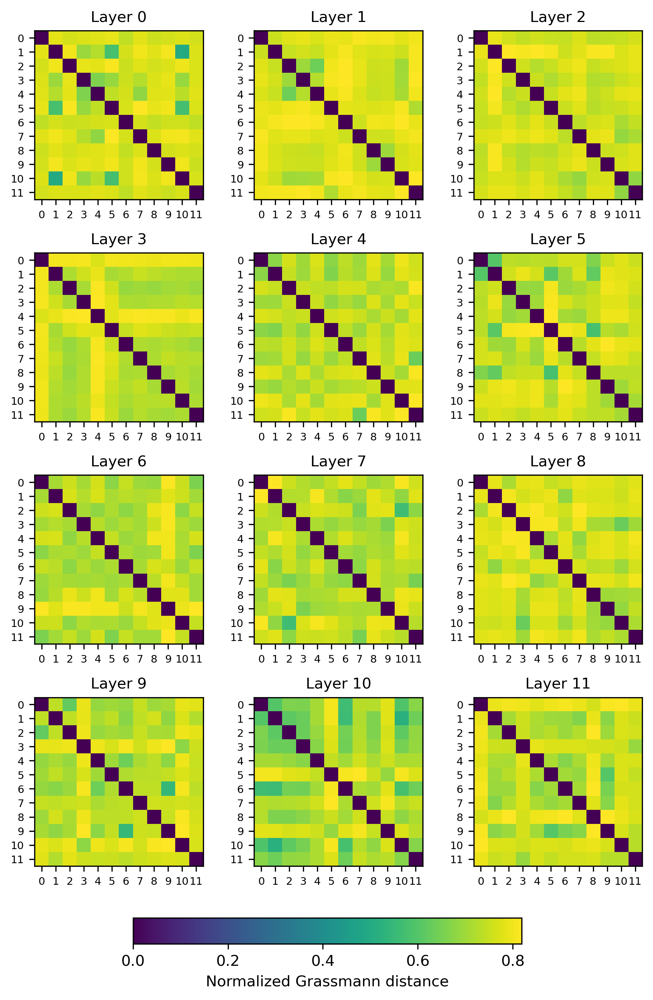

In [9]:
fig, axs = plt.subplots(4, 3, figsize=(6, 8), dpi=300)
cmap = plt.get_cmap('viridis')

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    grassmann_U_distance = np.zeros([12, 12], dtype=np.float32)
    U = torch.empty(12, 769, 64)
    for head in range(12):
        J = torch.empty(769, 769)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]
        _U, _, _ = svd(J)
        U[head] = torch.tensor(_U[:, :64])

    for i in range(12):
        for j in range(12):
            if i > j:
                grassmann_U_distance[i, j] = np.sqrt(np.sum(subspace_angles(U[i], U[j])**2)) / (4*np.pi)
                grassmann_U_distance[j, i] = grassmann_U_distance[i, j]

    ax = axs[layer//3, layer%3]
    im = ax.imshow(grassmann_U_distance, cmap='viridis', interpolation='nearest')
    ax.set_title(f"Layer {layer}", fontsize=10)
    ax.set_xticks(np.arange(12))
    ax.set_yticks(np.arange(12))
    ax.tick_params(axis='both', which='major', labelsize=7)

plt.tight_layout(pad=0, w_pad=0.8, h_pad=0.8)
cbar_ax = fig.add_axes([0.2, -0.08, 0.6, 0.03])
fig.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Normalized Grassmann distance', shrink=0.8)
plt.subplots_adjust(bottom=0.01)
plt.savefig('grassmann_U_distance.pdf', dpi=300, bbox_inches='tight')
plt.show()

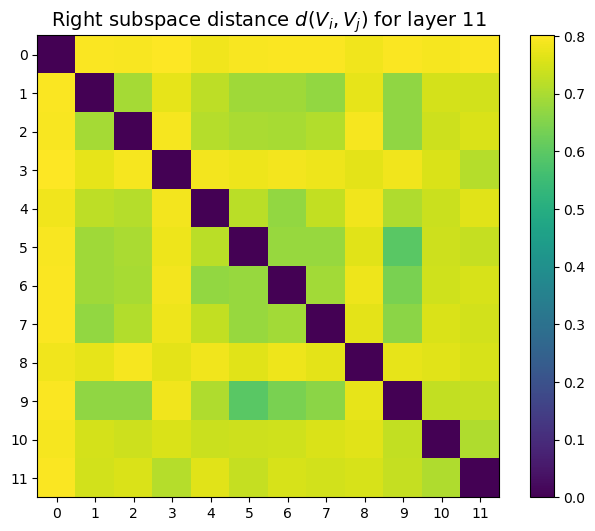

In [10]:
grassmann_V_distance = np.zeros([12, 12], dtype=np.float32)
for i in range(12):
    for j in range(12):
        if i > j:
            #grassmann_V_distance[i, j] = np.sum(1-np.cos(subspace_angles(V[i], V[j]))**2)
            grassmann_V_distance[i, j] = np.sqrt(np.sum(subspace_angles(V[i], V[j])**2)) / (4*np.pi)
            grassmann_V_distance[j, i] = grassmann_V_distance[i, j]

fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(grassmann_V_distance, cmap='viridis', interpolation='nearest')
ax.set_title(f'Right subspace distance $d(V_i, V_j)$ for layer {layer}', fontsize=14)
plt.colorbar(ax.imshow(grassmann_V_distance, cmap='viridis', interpolation='nearest'))
plt.xticks(ticks=np.arange(12))
plt.yticks(ticks=np.arange(12))
plt.show()

/tmp/ipykernel_3048/1468074237.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  manifold_distance = np.sqrt(sigma_distance**2 + grassmann_V_distance**2 + grassmann_U_distance**2) / np.sqrt(3)


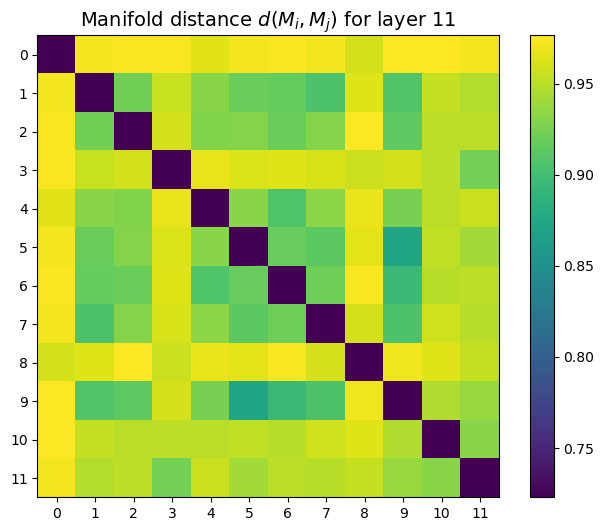

In [11]:
manifold_distance = np.sqrt(sigma_distance**2 + grassmann_V_distance**2 + grassmann_U_distance**2) / np.sqrt(3)
fig, ax = plt.subplots(figsize=(8, 6))
ax.imshow(manifold_distance, cmap='viridis', interpolation='nearest')
ax.set_title(f'Manifold distance $d(M_i, M_j)$ for layer {layer}', fontsize=14)
plt.colorbar(ax.imshow(manifold_distance, cmap='viridis', interpolation='nearest'))
plt.xticks(ticks=np.arange(12))
plt.yticks(ticks=np.arange(12))
plt.show()


In [12]:
import numpy as np
import plotly.graph_objects as go

# Step 1: Create a rank-2 non-symmetric matrix A via SVD components
u1 = np.array([1, 0, 0])
u2 = np.array([0, 1, 0])
v1 = np.array([1, 1, 0]) / np.sqrt(2)
v2 = np.array([0, 1, 1]) / np.sqrt(2)
sigma = np.array([3, 2])

U = np.column_stack((u1, u2))
V = np.column_stack((v1, v2))
Sigma = np.diag(sigma)
A = U @ Sigma @ V.T

# Step 2: Define input vectors x and y
x = np.array([1, -2, 3])
y = np.array([1, 1, 3])

# Step 3: Compute SVD-based projections
x_U = U.T @ x
y_V = V.T @ y
x_proj = U @ x_U  # U U^T x
y_proj = V @ y_V  # V V^T y

# Step 4: Create plane grids for U and V column spaces
plane_range = np.linspace(-4, 4, 10)
u_plane = np.array([a * u1 + b * u2 for a in plane_range for b in plane_range])
v_plane = np.array([a * v1 + b * v2 for a in plane_range for b in plane_range])

# Step 5: Compute bilinear form
B_xy = x_U.T @ Sigma @ y_V

# Step 6: Prepare Plotly figure
fig = go.Figure()

# U plane
fig.add_trace(go.Mesh3d(
    x=u_plane[:, 0], y=u_plane[:, 1], z=u_plane[:, 2],
    opacity=0.3, color='blue', name='U subspace'
))

# V plane
fig.add_trace(go.Mesh3d(
    x=v_plane[:, 0], y=v_plane[:, 1], z=v_plane[:, 2],
    opacity=0.3, color='red', name='V subspace'
))

# x and y vectors
fig.add_trace(go.Scatter3d(x=[0, x[0]], y=[0, x[1]], z=[0, x[2]], mode='lines+markers', name='x', line=dict(color='blue')))
fig.add_trace(go.Scatter3d(x=[0, y[0]], y=[0, y[1]], z=[0, y[2]], mode='lines+markers', name='y', line=dict(color='red')))

# Projections
fig.add_trace(go.Scatter3d(x=[0, x_proj[0]], y=[0, x_proj[1]], z=[0, x_proj[2]], mode='lines+markers', name='Proj x (U)', line=dict(color='darkblue', dash='dash')))
fig.add_trace(go.Scatter3d(x=[0, y_proj[0]], y=[0, y_proj[1]], z=[0, y_proj[2]], mode='lines+markers', name='Proj y (V)', line=dict(color='darkred', dash='dash')))

# Bilinear form annotation
fig.add_trace(go.Scatter3d(
    x=[0], y=[0], z=[4],
    mode='text',
    text=[f'B(x,y) = {B_xy:.2f}'],
    showlegend=False
))

# Layout
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-6, 6]),
        yaxis=dict(range=[-6, 6]),
        zaxis=dict(range=[-6, 6]),
        aspectmode='cube',
    ),
    title="Bilinear Form Geometry: Projections into U and V Subspaces",
    legend=dict(x=0.01, y=0.99)
)

fig.show()


In [13]:
# angle between planes
un = np.cross(u1, u2)
vn = np.cross(v1, v2)

np.dot(un, vn) / (np.linalg.norm(un) * np.linalg.norm(vn))
un, vn

(array([0, 0, 1]), array([ 0.5, -0.5,  0.5]))

In [14]:
np.cos(subspace_angles(U,V))

array([0.57735027, 1.        ])

In [15]:
x_proj / np.linalg.norm(x_proj), y_proj / np.linalg.norm(y_proj)

(array([ 0.4472136 , -0.89442719,  0.        ]),
 array([0.26726124, 0.80178373, 0.53452248]))

In [16]:
y / np.linalg.norm(y), x / np.linalg.norm(x)

(array([0.30151134, 0.30151134, 0.90453403]),
 array([ 0.26726124, -0.53452248,  0.80178373]))

https://c3d.libretexts.org/CalcPlot3D/index.html?type=implicit;equation=z~0;cubes=1;visible=true;fixdomain=false;xmin=-1.5;xmax=1.5;ymin=-1.5;ymax=1.5;zmin=-1.5;zmax=1.5;alpha=62;hidemyedges=false;view=0;format=constant;constcol=rgb(17,109,192)&type=implicit;equation=x-y+z~0;cubes=1;visible=true;fixdomain=false;xmin=-1.5;xmax=1.5;ymin=-1.5;ymax=1.5;zmin=-1.5;zmax=1.5;alpha=84;hidemyedges=false;view=0;format=constant;constcol=rgb(153,0,0)&type=vector;vector=%3C0.26726124,%20-0.53452248,%20%200.80178373%3E;visible=true;color=rgb(17,109,192);size=3;initialpt=(0,0,0);dashed=true&type=vector;vector=%3C0.4472136%20,%20-0.89442719,%20%200.%20%20%20%20%20%20%20%20%3E;visible=true;color=rgb(17,109,192);size=3;initialpt=(0,0,0);dashed=undefined&type=vector;vector=%3C0.30151134,%200.30151134,%200.90453403%3E;visible=true;color=rgb(153,0,0);size=3;initialpt=(0,0,0);dashed=undefined&type=vector;vector=%3C0.26726124,%200.80178373,%200.53452248%3E;visible=true;color=rgb(153,0,0);size=3;initialpt=(0,0,0);dashed=undefined&type=text;text=x;visible=true;point=(0.26726124,-0.53452248,0.80178373);color=rgb(17,109,192);font=Times%20New%20Roman;fontsize=20pt;bold=true;italic=true;fontmath=true;align=Upper-right&type=text;text=y;visible=true;point=(0.30151134,0.30151134,0.90453403);color=rgb(153,0,0);font=Times%20New%20Roman;fontsize=20pt;bold=true;italic=true;fontmath=true;align=Upper-right&type=text;text=UU%E1%B5%80x;visible=true;point=(0.4472136,-0.89442719,0.);color=rgb(17,109,192);font=Times%20New%20Roman;fontsize=16pt;bold=true;italic=true;fontmath=true;align=Center-left&type=text;text=VV%E1%B5%80y;visible=true;point=(0.26726124,0.80178373,0.53452248);color=rgb(153,0,0);font=Times%20New%20Roman;fontsize=16pt;bold=true;italic=true;fontmath=true;align=Upper-right&type=text;text=Gr%E2%82%82(%E2%84%9D%C2%B3);visible=true;point=(0.5,0.85,1.4);color=rgb(153,0,0);font=Times%20New%20Roman;fontsize=16pt;bold=true;italic=false;fontmath=true;align=Upper-right&type=text;text=Gr%E2%82%82(%E2%84%9D%C2%B3);visible=true;point=(-1,-2.6,-1);color=rgb(17,109,192);font=Times%20New%20Roman;fontsize=16pt;bold=true;italic=false;fontmath=true;align=Upper-right&type=window;showfunnot=false;hsrmode=0;nomidpts=true;anaglyph=-1;center=9.002374954011385,3.1194507087975296,3.037477977330581,1;focus=0,0,0,1;up=-0.3671688613747783,-0.16655300304178933,0.9151213714117437,1;transparent=false;alpha=140;twoviews=false;unlinkviews=false;axisextension=0.7;shownormals=false;shownormalsatpts=false;xaxislabel=x;yaxislabel=y;zaxislabel=z;edgeson=true;faceson=true;showbox=true;showaxes=true;showticks=false;perspective=true;centerxpercent=0.5;centerypercent=0.5;rotationsteps=30;autospin=true;xygrid=false;yzgrid=false;xzgrid=false;gridsonbox=true;gridplanes=true;gridcolor=rgb(128,128,128);lastaddedsurfaceactive=true;disabletrace=false;activefun=-1;xmin=-1.5;xmax=1.5;ymin=-1.5;ymax=1.5;zmin=-1.5;zmax=1.5;xscale=1;yscale=1;zscale=1;zcmin=-4;zcmax=4;xscalefactor=1;yscalefactor=1;zscalefactor=1;tracemode=0;keep2d=false;zoom=1.619556

In [17]:
U_all = torch.empty(12, 12, 769, 64)

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    grassmann_V_distance = np.zeros([12, 12], dtype=np.float32)
    U, V = torch.empty(12, 769, 64), torch.empty(12, 769, 64)
    for head in range(12):
        J = torch.empty(769, 769)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]
        _U, _, _Vt = svd(J)
        U[head] = torch.tensor(_U[:, :64])
        U_all[layer, head] = U[head]

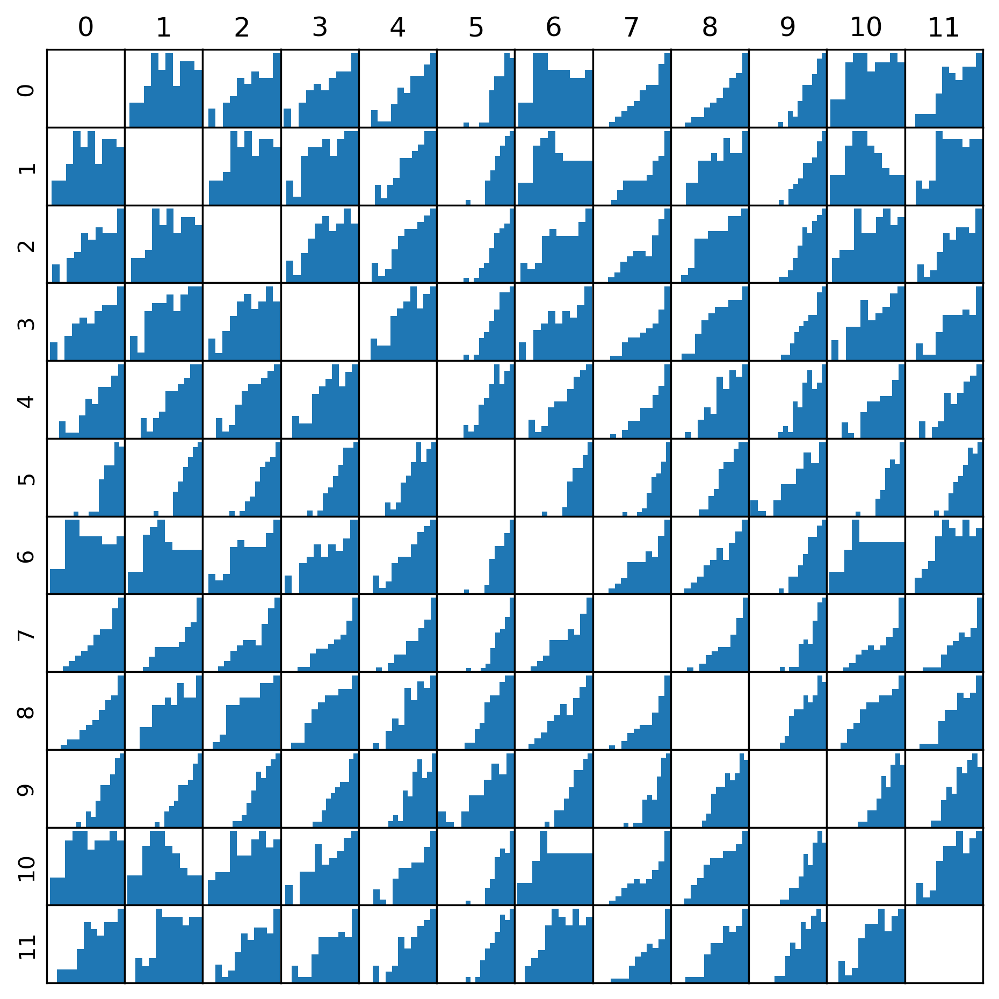

In [23]:
LAYER = 10

fig, axs = plt.subplots(12, 12, figsize=(6, 6), dpi=300)

for i in range(12):
    for j in range(12):
        angles = subspace_angles(U_all[LAYER, i], U_all[LAYER, j])
        ax = axs[i, j]
        ax.hist(angles, bins=10, density=True)
        ax.set_xlim(0, np.pi/2)
        ax.set_xticks([])
        ax.set_yticks([])
        if i == 0:
            ax.set_title(f'{j}')
        if j == 0:
            ax.set_ylabel(f'{i}')

plt.tight_layout(pad=0)
plt.savefig(f'../fig/layer_{LAYER}_subspace_angles.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


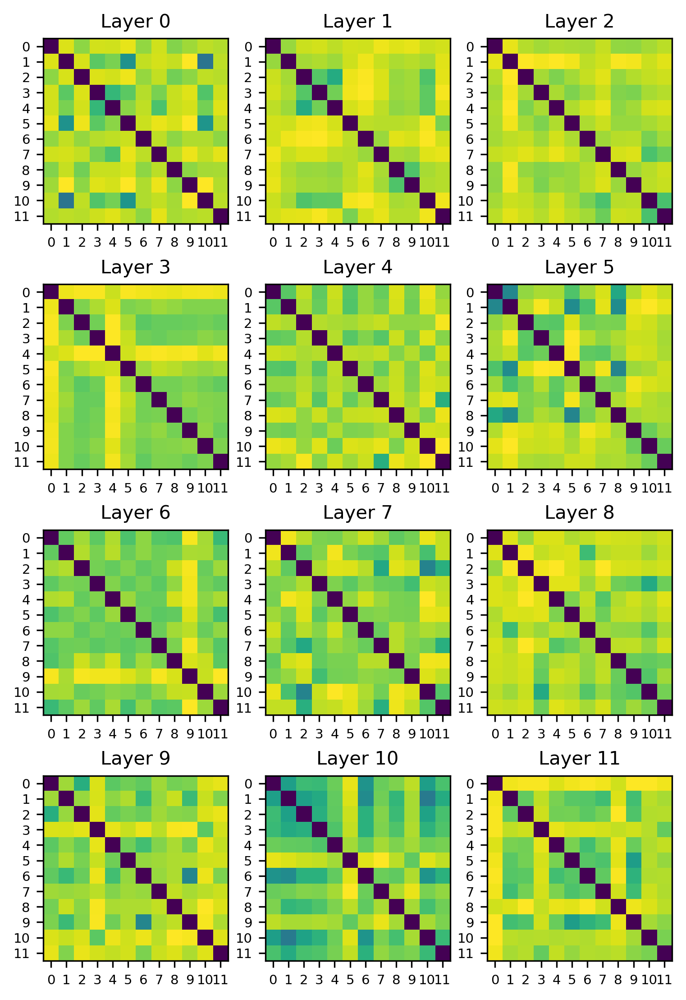

In [ ]:
fig, axs = plt.subplots(4, 3, figsize=(6, 8), dpi=300)
cmap = plt.get_cmap('viridis')

for layer in range(12):
    WQ_layer = WQ[layer]
    bQ_layer = bQ[layer]
    WK_layer = WK[layer]
    bK_layer = bK[layer]
    distance = np.zeros([12, 12], dtype=np.float32)
    U = torch.empty(12, 769, 64)
    V = torch.empty(12, 769, 64)
    S = torch.empty(12, 64)
    for head in range(12):
        J = torch.empty(769, 769)
        J[:768, :768] = WQ_layer[head] @ WK_layer[head].t()
        J[768, :768] = bQ_layer[head] @ WK_layer[head].t()
        J[:768, 768] = WQ_layer[head] @ bK_layer[head]
        J[768, 768] = bQ_layer[head].t() @ bK_layer[head]
        _U, _S, _Vt = svd(J)
        U[head] = torch.tensor(_U[:, :64])
        V[head] = torch.tensor(_Vt[:64, :].T)
        S[head] = torch.tensor(_S[:64])
        S[head] = S[head] / torch.max(S[head])


    for i in range(12):
        for j in range(12):
            if i > j:
                U_distance = np.sqrt(np.sum(subspace_angles(U[i], U[j])**2)) / (4*np.pi)
                V_distance = np.sqrt(np.sum(subspace_angles(V[i], V[j])**2)) / (4*np.pi)
                sigma_distance = torch.linalg.norm(S[i] - S[j])
                distance[i, j] = (np.sqrt(V_distance**2 + U_distance**2) / np.sqrt(2))**2
                distance[j, i] = distance[i, j]

    ax = axs[layer//3, layer%3]
    im = ax.imshow(distance, cmap='viridis', interpolation='nearest')
    ax.set_title(f"Layer {layer}", fontsize=10)
    ax.set_xticks(np.arange(12))
    ax.set_yticks(np.arange(12))
    ax.tick_params(axis='both', which='major', labelsize=7)

plt.tight_layout(pad=0, w_pad=0.8, h_pad=0.8)
#cbar_ax = fig.add_axes([0.2, -0.08, 0.6, 0.03])
#fig.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Normalized Grassmann distance', shrink=0.8)
#plt.subplots_adjust(bottom=0.01)
plt.savefig('distance.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

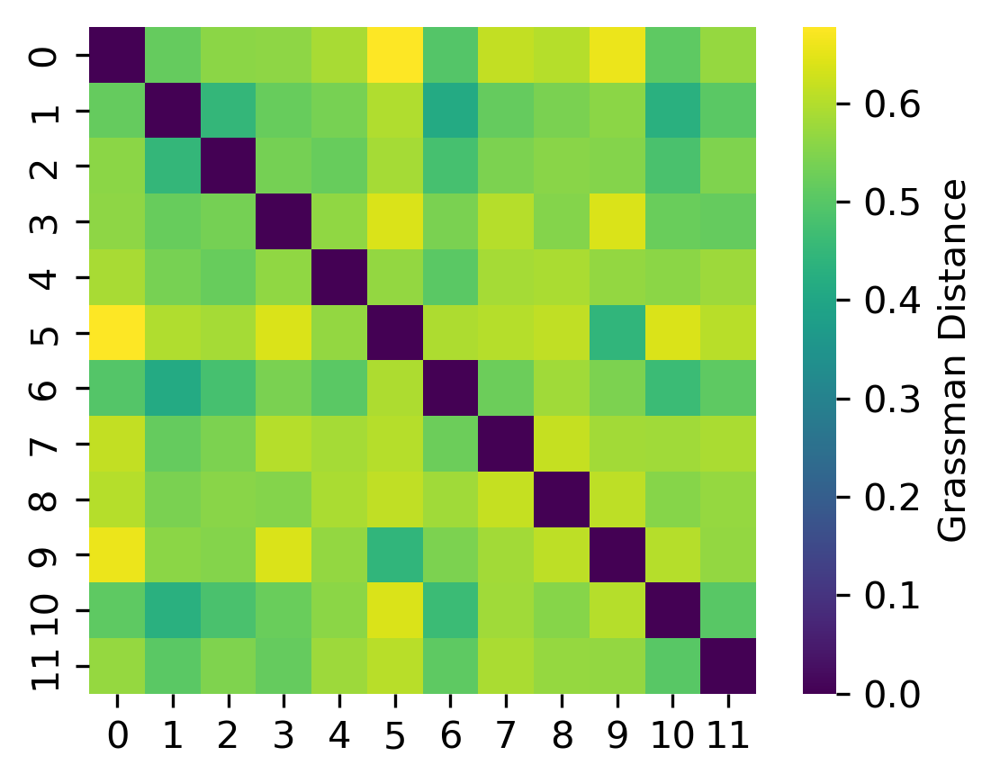

In [50]:
import seaborn as sns

LAYER = 10
distance = np.zeros([12, 12], dtype=np.float32)
for i in range(12):
    for j in range(12):
        if i > j:
            U_distance = np.sqrt(np.sum(subspace_angles(U_all[LAYER, i], U_all[LAYER, j])**2)) / (4*np.pi)
            V_distance = np.sqrt(np.sum(subspace_angles(V[i], V[j])**2)) / (4*np.pi)
            sigma_distance = torch.linalg.norm(S[i] - S[j])
            distance[i, j] = (V_distance**2 + U_distance**2)/2
            distance[j, i] = distance[i, j]

fig, ax = plt.subplots(figsize=(4, 3), dpi=300)
sns.heatmap(distance, cmap='viridis', square=True, cbar_kws={"label": "Grassman Distance"}, ax=ax)
plt.tight_layout()
plt.savefig(f'../fig/layer_{LAYER}_distance.svg', dpi=300, bbox_inches='tight', transparent=True)